<h1>Table of contents</h1>

<div class="alert alert-block alert-info" style="margin-top: 20px">
    <ol>
        <li><a href="#Dataset2">About the data set 2</a></li>
        <li><a href="#NYC">Acquisition and Processing NYC neighborhoods data</a></li>
        <li><a href="#Foursquare.com_infomation">Foursquare.com information</a></li>
        <li><a href="#BM_GPS">GPS data for Bronx-Manhattan</a></li>
        <li><a href="#BM_Venues">Business venues in Bronx-Manhattan</a></li>
        <li><a href="#BM_Venues_Pharmacy">Group Business venues and Pharmacy data in Bronx-Manhattan </a></li>
        <li><a href="#BM_Sklearn">Sklearn library and K means in clustering pharmacies and neighborhoods in BM</a></li>
        <li><a href="#Hospital">New York Hospital list</a></li>
        <li><a href="#BM_Map">Cluster Map of Bronx-Manhattan Pharmacies and Hospitals location with Measurement tool</a></li>
        <li><a href="#Bronx">Bronx Neighborhoods does not have Pharmacy</a></li>
        <li><a href="#QBK">Queens-Brooklyn Data</a></li>
    </ol>
</div>
<br>
<hr>

<div id="Dataset2">
    <h2>1.About the dataset 2</h2> 
</div>   

Dataset 2 is the key data for the battle of 2 neighborhoods, Bronx-Mahattan(BM) and Queens-Brooklyn(QBK).

Retrieving data from Foursquare.com, focusing mainly on Business venues, Pharmacies and Hospitals in 2 groups

<div id="NYC">
    <h2>2.Acquisition and Processing NYC neighborhoods data</h2>
</div>

In [102]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import folium # map rendering library

!conda install -c conda-forge geopy --yes 

from geopy.geocoders import Nominatim
import os

import json
import time
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
%matplotlib inline
print('Libraries imported.')

Solving environment: ...working... done

# All requested packages already installed.

Libraries imported.


<div id="Foursquare.com_infomation">
    <h2>3.Foursquare.com information
    </h2>  
</div>

In [1]:
CLIENT_ID = 'CMO112QPJVULQSTSGPTAGBPTIM2ENHRR54NQNLAHRTYSYDTW' # your Foursquare ID
CLIENT_SECRET = '3ZVXR3RN4B1RMBM1OWPL5PYIECSNWEMK0AA4EYU3IWW0WZ3E' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails: 582027251')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails: 582027251
CLIENT_ID: CMO112QPJVULQSTSGPTAGBPTIM2ENHRR54NQNLAHRTYSYDTW
CLIENT_SECRET:3ZVXR3RN4B1RMBM1OWPL5PYIECSNWEMK0AA4EYU3IWW0WZ3E


In [104]:
address = 'New York City, NY'
geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [105]:

def get_new_york_data():
    url='https://cocl.us/new_york_dataset'
    resp=requests.get(url).json()
    # all data is present in features label
    features=resp['features']
    
    # define the dataframe columns
    column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 
    # instantiate the dataframe
    new_york_data = pd.DataFrame(columns=column_names)
    
    for data in features:
        borough = data['properties']['borough'] 
        neighborhood_name = data['properties']['name']
        
        neighborhood_latlon = data['geometry']['coordinates']
        neighborhood_lat = neighborhood_latlon[1]
        neighborhood_lon = neighborhood_latlon[0]
    
        new_york_data = new_york_data.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)
    
    return new_york_data

In [106]:
# get new york data
new_york_data=get_new_york_data()

In [107]:
new_york_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [108]:
new_york_data.shape

(306, 4)

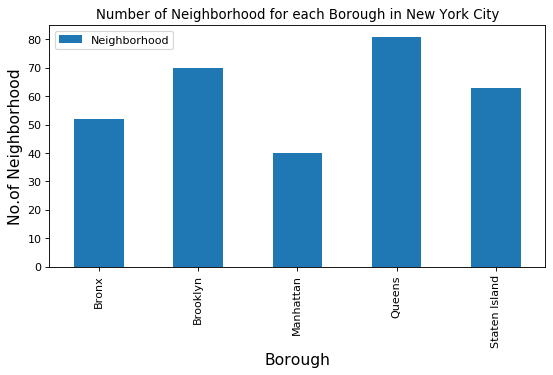

In [109]:
plt.figure(figsize=(8,4), dpi = 80)
# title
plt.title('Number of Neighborhood for each Borough in New York City')
#On x-axis
plt.xlabel('Borough', fontsize = 14)
#On y-axis
plt.ylabel('No.of Neighborhood', fontsize=14)
#giving a bar plot
new_york_data.groupby('Borough')['Neighborhood'].count().plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()

<div id="BM_GPS">
    <h2>4.GPS data for Bronx-Manhattan</h2>  
</div>

In [110]:
BM_Geo = new_york_data.loc[(new_york_data['Borough'] == 'Bronx')|(new_york_data['Borough'] == 'Manhattan')]
BM_Geo = BM_Geo.reset_index(drop=True)
BM_Geo.tail()

,Borough,Neighborhood,Latitude,Longitude
87,Manhattan,Flatiron,40.739673,-73.990947
88,Bronx,Bronxdale,40.852723,-73.861726
89,Bronx,Allerton,40.865788,-73.859319
90,Bronx,Kingsbridge Heights,40.870392,-73.901523
91,Manhattan,Hudson Yards,40.756658,-74.000111


#### There are 92 neighborhoods in Manhattan and Bronx

In [111]:
# create map of NYC using latitude and longitude values
map_BM = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(BM_Geo['Latitude'], BM_Geo['Longitude'], BM_Geo['Borough'], BM_Geo['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_BM)  
    
map_BM

<div id="BM_Venues">
    <h2>5.Business venues in Bronx-Manhattan </h2>
  
</div>

In [112]:
def getNearbyVenues(names, latitudes, longitudes, LIMIT=200, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT
        )
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [113]:
# Get top 100 venues 
LIMIT = 100 # Maximum is 100
Radius = 1000
#cities = ['New york, NY', 'Queens, NY', 'Bronx, NY', 'Brooklyn, NY', 'staten island, ny']
latitude= 40.7127281
longitude= -74.0060152
#for city in cities:
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&near={}&limit={}&categoryId={}'.format(
        CLIENT_ID, 
        CLIENT_SECRET, 
        VERSION, 
        latitude,
        longitude,
        LIMIT,
        "4bf58dd8d48988d196941735") # Hospital category ID
results = requests.get(url).json()

In [114]:
BM_venues = getNearbyVenues(names=BM_Geo['Neighborhood'],
                                  latitudes=BM_Geo['Latitude'],
                                  longitudes=BM_Geo['Longitude'],
                                  LIMIT=100)

print('The "BM_venues" dataframe has {} venues and {} unique venue types.'.format(
      len(BM_venues['Venue Category']),
      len(BM_venues['Venue Category'].unique())))

BM_venues.to_csv('BM_venues.csv', sep=',', encoding='UTF8')
BM_venues.head()

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Chinatown
Washington Heights
Inwood
Hamilton Heights
Manhattanville
Central Harlem
East Harlem
Upper East Side
Yorkville
Lenox Hill
Roosevelt Island
Upper West Side
Lincoln Square
Clinton
Midtown
Murray Hill
Chelsea
Greenwich Village
East Village
Lower East Side
Tribeca
Little Italy
Soho
West Village
Manhattan Valley
Morningside Heights
Gramercy
Battery Park City
Financial District
Carnegie Hill
Noho
Civic Center
Midtown South
Claremont Village
Conc

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Ripe Kitchen & Bar,40.898152,-73.838875,Caribbean Restaurant
2,Wakefield,40.894705,-73.847201,Ali's Roti Shop,40.894036,-73.856935,Caribbean Restaurant
3,Wakefield,40.894705,-73.847201,Jackie's West Indian Bakery,40.889283,-73.843310,Caribbean Restaurant
4,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop


In [115]:
colnames = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']
BM_venues = pd.read_csv('BM_venues.csv', skiprows=1, names=colnames)
BM_venues.columns = BM_venues.columns.str.replace(' ', '')
BM_venues.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Ripe Kitchen & Bar,40.898152,-73.838875,Caribbean Restaurant
2,Wakefield,40.894705,-73.847201,Ali's Roti Shop,40.894036,-73.856935,Caribbean Restaurant
3,Wakefield,40.894705,-73.847201,Jackie's West Indian Bakery,40.889283,-73.843310,Caribbean Restaurant
4,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop


In [116]:
BM_venues.shape


(7242, 7)

### Business venues map of Bronx-Manhattan 

In [117]:
def Venues_Map(Borough_name, Borough_neighborhoods):
    
    # Use geopy library to get the latitude and longitude values 
    geolocator = Nominatim(user_agent="Jupyter")
    Borough_location = geolocator.geocode(Borough_name) # BM, NY'
    Borough_latitude = Borough_location.latitude
    Borough_longitude = Borough_location.longitude
    print('The geographical coordinates of "{}" are {}, {}.'.format(Borough_name, Borough_latitude, Borough_longitude))
    
    # To verify the number of Boroughs and Neighborhoods in the extracted data
    print('The "{}" dataframe has {} different venue types and {} neighborhoods.'.format(
          Borough_name,
          len(Borough_neighborhoods['VenueCategory'].unique()),
          len(Borough_neighborhoods['Neighborhood'].unique())))
    
    # create map of city using latitude and longitude values
    map_Borough = folium.Map(location=[Borough_latitude, Borough_longitude], zoom_start=10)

    # add markers to map
    for lat, lng, venue, category in zip(Borough_neighborhoods['VenueLatitude'], Borough_neighborhoods['VenueLongitude'], Borough_neighborhoods['Venue'], Borough_neighborhoods['VenueCategory']):
        label = '{}, {}'.format(category, venue)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=0.1,
            popup=label,
            color='red',
            fill=True,
            fill_color='#FF0000',
            fill_opacity=0.3).add_to(map_Borough)  

    return map_Borough

In [118]:
Venues_Map('Bronx-Manhattan, NY', BM_venues)


The geographical coordinates of "Bronx-Manhattan, NY" are 40.7985538, -73.9181346.
The "Bronx-Manhattan, NY" dataframe has 374 different venue types and 92 neighborhoods.


In [119]:
BM_venues.groupby('VenueCategory')['Venue'].count().sort_values(ascending=False)


VenueCategory
Pizza Place                                 365
Coffee Shop                                 227
Italian Restaurant                          223
Park                                        201
Sandwich Place                              167
Bakery                                      153
Donut Shop                                  153
Mexican Restaurant                          148
Deli / Bodega                               140
Grocery Store                               140
Gym                                         130
Café                                        127
Pharmacy                                    121
American Restaurant                         120
Bar                                         116
Fast Food Restaurant                        105
Chinese Restaurant                          103
Supermarket                                  93
Gym / Fitness Center                         93
Ice Cream Shop                               91
Hotel                     

In [120]:
BM_venues.groupby('Neighborhood').count()

,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
Neighborhood,,,,,,
Allerton,65,65,65,65,65,65
Battery Park City,100,100,100,100,100,100
Baychester,99,99,99,99,99,99
Bedford Park,76,76,76,76,76,76
Belmont,100,100,100,100,100,100
Bronxdale,100,100,100,100,100,100
Carnegie Hill,100,100,100,100,100,100
Castle Hill,36,36,36,36,36,36
Central Harlem,100,100,100,100,100,100


In [121]:
print('There are {} uniques categories.'.format(len(BM_venues['VenueCategory'].unique())))

There are 374 uniques categories.


<div id="BM_Venues_Pharmacy">
    <h2>6.Group Business venues and Pharmacy data in Bronx-Manhattan </h2>
  
</div>

In [122]:
# one hot encoding
BM_onehot = pd.get_dummies(BM_venues[['VenueCategory']], prefix="", prefix_sep="")

#column lists before adding neighborhood
column_names = ['Neighborhood'] + list(BM_onehot.columns)

# add neighborhood column back to dataframe
BM_onehot['Neighborhood'] = BM_venues['Neighborhood'] 

# move neighborhood column to the first column
BM_onehot = BM_onehot[column_names]

BM_onehot.head()

,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cambodian Restaurant,Camera Store,Campground,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Historic Site,History Museum,Hobby Shop,Hockey Rink,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lebanese Restaurant,Library,Lighthouse,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Store,Paella Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Peruvian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pier,Pilates Studio,Pizza Place,Planetarium,Playground,Plaza,Poke Place,Pool,Pool Hall,Post Office,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Rental Service,Reservoir,Resi

In [123]:
Pharmacy_List = []
search = "Pharmacy"
for i in BM_onehot.columns :
    if search in i:
        Pharmacy_List.append(i)

In [124]:
Pharmacy_List

['Pharmacy']

In [125]:

col_name = []
col_name = ['Neighborhood'] + Pharmacy_List
BM_Pharmacy = BM_onehot[col_name]
BM_Pharmacy = BM_Pharmacy.iloc[:,1::]


In [126]:
BM_Pharmacy.head()

,Neighborhood,Pharmacy
0,Wakefield,0
1,Wakefield,0
2,Wakefield,0
3,Wakefield,0
4,Wakefield,0


In [127]:
BM_Pharmacy_grouped = BM_Pharmacy.groupby('Neighborhood').sum().reset_index()


In [128]:
BM_Pharmacy_grouped

,Neighborhood,Pharmacy
0,Allerton,3
1,Battery Park City,0
2,Baychester,4
3,Bedford Park,1
4,Belmont,2
5,Bronxdale,4
6,Carnegie Hill,0
7,Castle Hill,1
8,Central Harlem,0
9,Chelsea,0


In [129]:
BM_Pharmacy_grouped['Total'] = BM_Pharmacy_grouped .sum(axis=1)

<div id="BM_Sklearn">
    <h2>7.Sklearn library and K means in clustering pharmacies and neighborhoods in BM </h2>
  
</div>

In [130]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn.metrics import silhouette_score
from sklearn import datasets
import numpy as np
from sklearn.cluster import KMeans

In [131]:
BM_grouped_clustering = BM_Pharmacy_grouped.drop('Neighborhood', 1)

for n_cluster in range(2, 10):
    kmeans = KMeans(n_clusters=n_cluster).fit(BM_grouped_clustering)
    label = kmeans.labels_
    sil_coeff = silhouette_score(BM_grouped_clustering, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))


For n_clusters=2, The Silhouette Coefficient is 0.7161071495883001
For n_clusters=3, The Silhouette Coefficient is 0.795848359113519
For n_clusters=4, The Silhouette Coefficient is 0.877479727507791
For n_clusters=5, The Silhouette Coefficient is 0.9471618357487922
For n_clusters=6, The Silhouette Coefficient is 0.9836956521739131
For n_clusters=7, The Silhouette Coefficient is 0.9891304347826086


C:\Users\Farmboy\anaconda3\envs\Pandas\lib\site-packages\ipykernel_launcher.py:4: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  after removing the cwd from sys.path.


For n_clusters=8, The Silhouette Coefficient is 0.9891304347826086
For n_clusters=9, The Silhouette Coefficient is 0.9891304347826086


C:\Users\Farmboy\anaconda3\envs\Pandas\lib\site-packages\ipykernel_launcher.py:4: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (9). Possibly due to duplicate points in X.
  after removing the cwd from sys.path.


In [132]:
# set number of clusters
kclusters = 7
BM_grouped_clustering = BM_Pharmacy_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(BM_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([4, 2, 1, 0, 3, 1, 2, 0, 2, 2, 2, 0, 2, 2, 2, 2, 4, 1, 4, 3, 0, 0,
       2, 3, 3, 0, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 3, 3, 2, 2, 0, 2, 1, 2,
       2, 3, 3, 1, 0, 0, 0, 1, 5, 5, 0, 1, 1, 2, 2, 0, 4, 4, 0, 3, 4, 3,
       0, 0, 2, 1, 2, 0, 1, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 0, 6, 2, 2, 2,
       4, 3, 0, 2])

In [133]:
BM_results = pd.DataFrame(kmeans.cluster_centers_)
BM_results.columns = BM_grouped_clustering.columns
BM_results.index = ['cluster0','cluster1','cluster2','cluster3','cluster4','cluster5','cluster6']
BM_results['Total Sum'] = BM_results.sum(axis = 1)
BM_results

,Pharmacy,Total,Total Sum
cluster0,1.0,1.0,2.0
cluster1,4.0,4.0,8.0
cluster2,0.0,0.0,0.0
cluster3,2.0,2.0,4.0
cluster4,3.0,3.0,6.0
cluster5,5.0,5.0,10.0
cluster6,6.0,6.0,12.0


In [134]:
BM_Pharmacy_grouped

,Neighborhood,Pharmacy,Total
0,Allerton,3,3
1,Battery Park City,0,0
2,Baychester,4,4
3,Bedford Park,1,1
4,Belmont,2,2
5,Bronxdale,4,4
6,Carnegie Hill,0,0
7,Castle Hill,1,1
8,Central Harlem,0,0
9,Chelsea,0,0


In [135]:
BM_results_merged = pd.DataFrame(BM_Pharmacy_grouped['Neighborhood'])
BM_results_merged['Total'] = BM_Pharmacy_grouped['Total']
BM_results_merged = BM_results_merged.assign(Cluster_Labels = kmeans.labels_)


In [136]:
print(BM_results_merged.shape)
BM_results_merged

(92, 3)


,Neighborhood,Total,Cluster_Labels
0,Allerton,3,4
1,Battery Park City,0,2
2,Baychester,4,1
3,Bedford Park,1,0
4,Belmont,2,3
5,Bronxdale,4,1
6,Carnegie Hill,0,2
7,Castle Hill,1,0
8,Central Harlem,0,2
9,Chelsea,0,2


In [137]:
BM_merged = BM_Geo

BM_merged = BM_merged.join(BM_results_merged.set_index('Neighborhood'), on='Neighborhood')

print(BM_merged.shape)
BM_merged.tail(10) # check the last columns!

(92, 6)


,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
82,Bronx,Mount Hope,40.848842,-73.908299,4,1
83,Manhattan,Sutton Place,40.760280,-73.963556,0,2
84,Manhattan,Turtle Bay,40.752042,-73.967708,0,2
85,Manhattan,Tudor City,40.746917,-73.971219,0,2
86,Manhattan,Stuyvesant Town,40.731000,-73.974052,0,2
87,Manhattan,Flatiron,40.739673,-73.990947,1,0
88,Bronx,Bronxdale,40.852723,-73.861726,4,1
89,Bronx,Allerton,40.865788,-73.859319,3,4
90,Bronx,Kingsbridge Heights,40.870392,-73.901523,0,2
91,Manhattan,Hudson Yards,40.756658,-74.000111,0,2


In [138]:
# create pharmacy cluster map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add cluster markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(BM_merged['Latitude'], BM_merged['Longitude'], BM_merged['Neighborhood'], BM_merged['Cluster_Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
    

       
map_clusters

<div id="Hospital">
    <h2>8.New York Hospital list </h2>
  
</div>

In [139]:
LIMIT = 300 # Maximum is 100
cities = ["New York, NY", "Queens, NY", "Bronx, NY", "Brooklyn, NY", "Staten Island, NY"]
    
results = {}
for city in cities:
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&near={}&limit={}&categoryId={}'.format(
        CLIENT_ID, 
        CLIENT_SECRET, 
        VERSION, 
        city,
        LIMIT,
        "4bf58dd8d48988d196941735") # Hospital CATEGORY ID
    results[city] = requests.get(url).json()

In [140]:
df_venues={}
for city in cities:
    venues = json_normalize(results[city]['response']['groups'][0]['items'])
    df_venues[city] = venues[['venue.name','venue.id', 'venue.location.address', 'venue.location.lat', 'venue.location.lng']]
    df_venues[city].columns = ['Name','id', 'Address', 'Lat', 'Lng']
df_venues['New York, NY'].head()

C:\Users\Farmboy\anaconda3\envs\Pandas\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  This is separate from the ipykernel package so we can avoid doing imports until


,Name,id,Address,Lat,Lng
0,Hospital for Special Surgery,4a78348ff964a52046e51fe3,535 E 70th St,40.765348,-73.952689
1,Lenox Hill Hospital,4a4cc69df964a52040ad1fe3,100 E 77th St,40.773997,-73.960849
2,Memorial Sloan Kettering Rockefeller Outpatien...,4bcdb539937ca5935722ad92,160 E 53rd St,40.757704,-73.970021
3,Callen-Lorde Community Health Center,4abab3bff964a5208b8220e3,356 W 18th St,40.743188,-74.003067
4,NYU Langone Medical Center - Joan Tisch Center...,4ea8656b46902b1f95ad008b,207 E 84th St,40.777432,-73.954439


In [141]:
df_venues['New York, NY'].tail()

,Name,id,Address,Lat,Lng
95,St. Luke's Roosevelt Birthing Center,50f07a66e4b0170304c8a30b,1000 10th Ave,40.769489,-73.987786
96,Mount Sinai Guggenheim Pavilion,4e1c94ded22dd2c50eea57af,NaN,40.789974,-73.952929
97,7 Uris,50aac1e6e4b0102cd372d8c3,NaN,40.773284,-73.961202
98,MiDoctor,5e430f88c0d0dd00084635e3,715 9th Ave,40.762747,-73.989845
99,Bellevue Pediatrics 8N,4ee95d9861aff2afcd81fc46,NaN,40.739240,-73.973834


In [142]:
maps = {}
totalResults={}
for city in cities:
    city_lat = np.mean([results[city]['response']['geocode']['geometry']['bounds']['ne']['lat'],
                        results[city]['response']['geocode']['geometry']['bounds']['sw']['lat']])
    city_lng = np.mean([results[city]['response']['geocode']['geometry']['bounds']['ne']['lng'],
                        results[city]['response']['geocode']['geometry']['bounds']['sw']['lng']])
    maps[city] = folium.Map(location=[city_lat, city_lng], zoom_start=11)

    # add markers to map
    for lat, lng, label in zip(df_venues[city]['Lat'], df_venues[city]['Lng'], df_venues[city]['Name']):
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='blue',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(maps[city])  
    print(f"Total number of Hospitals in {city} = ", results[city]['response']['totalResults'])
    print("Showing Top 100")

Total number of Hospitals in New York, NY =  257
Showing Top 100
Total number of Hospitals in Queens, NY =  178
Showing Top 100
Total number of Hospitals in Bronx, NY =  121
Showing Top 100
Total number of Hospitals in Brooklyn, NY =  198
Showing Top 100
Total number of Hospitals in Staten Island, NY =  47
Showing Top 100


<div id="BM_Map">
    <h2>9.Cluster Map of Bronx-Manhattan Pharmacies and Hospitals location with Measurement tool </h2>
  
</div>

In [143]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(BM_merged['Latitude'], BM_merged['Longitude'], BM_merged['Neighborhood'], BM_merged['Cluster_Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
    
 # add cluster markers to map
city=cities[0] # Manhattan 
for lat, lng, label in zip(df_venues[city]['Lat'], df_venues[city]['Lng'], df_venues[city]['Name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
         fill_opacity=0.7,
            parse_html=False).add_to(map_clusters)
# add hospital markers to map
city=cities[2] # Bronx
for lat, lng, label in zip(df_venues[city]['Lat'], df_venues[city]['Lng'], df_venues[city]['Name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
         fill_opacity=0.7,
            parse_html=False).add_to(map_clusters)
# Measurement ruler icon tool to measure distances in map
    
from folium.plugins import MeasureControl
map_clusters.add_child(MeasureControl())

from folium.plugins import FloatImage
url = ('https://raw.githubusercontent.com/makinacorpus/Leaflet.MeasureControl/master/images/measure-control.png')
FloatImage(url, bottom=5, left=85).add_to(map_clusters)
       
map_clusters

In [144]:
BM_No_Pharmacy=BM_merged[BM_merged['Cluster_Labels'] == 2].reset_index(drop=True)
BM_No_Pharmacy.tail()

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
34,Manhattan,Turtle Bay,40.752042,-73.967708,0,2
35,Manhattan,Tudor City,40.746917,-73.971219,0,2
36,Manhattan,Stuyvesant Town,40.731000,-73.974052,0,2
37,Bronx,Kingsbridge Heights,40.870392,-73.901523,0,2
38,Manhattan,Hudson Yards,40.756658,-74.000111,0,2


<div id="Bronx">
    <h2>10.Bronx Neighborhoods do not have Pharmacy </h2>
  
</div>

In [145]:
Bronx=BM_No_Pharmacy[BM_No_Pharmacy['Borough'] == 'Bronx'].reset_index(drop=True)
Bronx

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Bronx,Fieldston,40.895437,-73.905643,0,2
1,Bronx,West Farms,40.839475,-73.877745,0,2
2,Bronx,High Bridge,40.836623,-73.926102,0,2
3,Bronx,Hunts Point,40.809730,-73.883315,0,2
4,Bronx,Clason Point,40.806551,-73.854144,0,2
5,Bronx,Throgs Neck,40.815109,-73.816350,0,2
6,Bronx,Claremont Village,40.831428,-73.901199,0,2
7,Bronx,Kingsbridge Heights,40.870392,-73.901523,0,2


In [146]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Bronx['Latitude'], Bronx['Longitude'], Bronx['Neighborhood'], Bronx['Cluster_Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
    

# add markers to map
city=cities[2] # Bronx
#venues_mean = [df_venues[city]['Lat'].mean(), df_venues[city]['Lng'].mean()]
for lat, lng, label in zip(df_venues[city]['Lat'], df_venues[city]['Lng'], df_venues[city]['Name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_clusters)
    #folium.PolyLine([venues_mean, [lat, lng]], color="green", weight=1.5, opacity=0.5).add_to(map_clusters)
    
# Measurement ruler icon tool to measure distances in map  
from folium.plugins import MeasureControl
map_clusters.add_child(MeasureControl())

from folium.plugins import FloatImage
url = ('https://raw.githubusercontent.com/makinacorpus/Leaflet.MeasureControl/master/images/measure-control.png')
FloatImage(url, bottom=5, left=85).add_to(map_clusters)
       
map_clusters

<div id="QBK">
    <h2>11.Queen_Brooklyn Data</h2>
    <br>
    The following steps are the same the data processing for Bronx-Manhattan
    <br>
  </div>

### GPS data for Queens_Brooklyn

In [147]:
QBK_Geo = new_york_data.loc[(new_york_data['Borough'] == 'Queens')|(new_york_data['Borough'] == 'Brooklyn')]
QBK_Geo = QBK_Geo.reset_index(drop=True)
QBK_Geo.head()

,Borough,Neighborhood,Latitude,Longitude
0,Brooklyn,Bay Ridge,40.625801,-74.030621
1,Brooklyn,Bensonhurst,40.611009,-73.995180
2,Brooklyn,Sunset Park,40.645103,-74.010316
3,Brooklyn,Greenpoint,40.730201,-73.954241
4,Brooklyn,Gravesend,40.595260,-73.973471


In [148]:
# create map of New York using latitude and longitude values
map_QBK = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(QBK_Geo['Latitude'], QBK_Geo['Longitude'], QBK_Geo['Borough'], QBK_Geo['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_QBK)  
    
map_QBK


In [149]:
def getNearbyVenues(names, latitudes, longitudes, LIMIT=200, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT
        )
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [150]:
QBK_venues = getNearbyVenues(names=QBK_Geo['Neighborhood'],
                                  latitudes=QBK_Geo['Latitude'],
                                  longitudes=QBK_Geo['Longitude'],
                                  LIMIT=100)

print('The "QBK_venues" dataframe has {} venues and {} unique venue types.'.format(
      len(QBK_venues['Venue Category']),
      len(QBK_venues['Venue Category'].unique())))

QBK_venues.to_csv('QBK_venues.csv', sep=',', encoding='UTF8')
QBK_venues.head()

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker Heights
Gerritsen Beach
Marine Park
Clinton Hill
Sea Gate
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Bergen Beach
Midwood
Prospect Park South
Georgetown
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Astoria
Woodside
Jackson Heights
Elmhurst
Howard Beach
Corona
Forest Hills
Kew Gardens
Richmond Hill
Flushing
Long Island City
Sunnyside
East Elmhurst
Maspeth
Ridgewood
Glendale
Rego Park
Woodhaven
Ozone Park
South Ozone Park
College Point
Whitestone
Bayside
Auburndale
Little Neck
Douglaston
Glen Oa

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Bay Ridge,40.625801,-74.030621,Pilo Arts Day Spa and Salon,40.624748,-74.030591,Spa
1,Bay Ridge,40.625801,-74.030621,Bagel Boy,40.627896,-74.029335,Bagel Shop
2,Bay Ridge,40.625801,-74.030621,Pegasus Cafe,40.623168,-74.031186,Breakfast Spot
3,Bay Ridge,40.625801,-74.030621,Ho' Brah Taco Joint,40.622960,-74.031371,Taco Place
4,Bay Ridge,40.625801,-74.030621,Cocoa Grinder,40.623967,-74.030863,Juice Bar


In [151]:
colnames = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']
QBK_venues = pd.read_csv('QBK_venues.csv', skiprows=1, names=colnames)
QBK_venues.columns = QBK_venues.columns.str.replace(' ', '')
QBK_venues.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
0,Bay Ridge,40.625801,-74.030621,Pilo Arts Day Spa and Salon,40.624748,-74.030591,Spa
1,Bay Ridge,40.625801,-74.030621,Bagel Boy,40.627896,-74.029335,Bagel Shop
2,Bay Ridge,40.625801,-74.030621,Pegasus Cafe,40.623168,-74.031186,Breakfast Spot
3,Bay Ridge,40.625801,-74.030621,Ho' Brah Taco Joint,40.622960,-74.031371,Taco Place
4,Bay Ridge,40.625801,-74.030621,Cocoa Grinder,40.623967,-74.030863,Juice Bar


In [174]:
QBK_venues.shape


(10917, 7)

In [152]:
QBK_venues.groupby('VenueCategory')['Venue'].count().sort_values(ascending=False)

VenueCategory
Pizza Place                                 541
Coffee Shop                                 313
Bakery                                      272
Bar                                         269
Deli / Bodega                               238
Donut Shop                                  237
Chinese Restaurant                          236
Italian Restaurant                          221
Grocery Store                               221
Bank                                        203
Park                                        200
Pharmacy                                    199
Sandwich Place                              198
Ice Cream Shop                              183
Caribbean Restaurant                        181
Café                                        170
Mexican Restaurant                          163
Supermarket                                 148
Bagel Shop                                  139
American Restaurant                         132
Fast Food Restaurant      

In [153]:
QBK_venues.groupby('Neighborhood').count()

,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
Neighborhood,,,,,,
Arverne,36,36,36,36,36,36
Astoria,100,100,100,100,100,100
Astoria Heights,83,83,83,83,83,83
Auburndale,100,100,100,100,100,100
Bath Beach,95,95,95,95,95,95
Bay Ridge,100,100,100,100,100,100
Bay Terrace,64,64,64,64,64,64
Bayside,100,100,100,100,100,100
Bayswater,10,10,10,10,10,10


In [154]:
print('There are {} uniques categories.'.format(len(QBK_venues['VenueCategory'].unique())))

There are 410 uniques categories.


 ### Group Business venues and Pharmacy data in Queens-Brooklyn

In [155]:
# one hot encoding
QBK_onehot = pd.get_dummies(QBK_venues[['VenueCategory']], prefix="", prefix_sep="")

#column lists before adding neighborhood
column_names = ['Neighborhood'] + list(QBK_onehot.columns)

# add neighborhood column back to dataframe
QBK_onehot['Neighborhood'] = QBK_venues['Neighborhood'] 

# move neighborhood column to the first column
QBK_onehot = QBK_onehot[column_names]

QBK_onehot.head()

,Neighborhood,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Candy Store,Cantonese Restaurant,Car Wash,Caribbean Restaurant,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Basketball Court,College Cafeteria,College Gym,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cruise,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Kofte Place,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Middle School,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern Greek Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,National Park,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoors & Recreation,Outlet Store,Paella Restaurant,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Pedestrian P

In [156]:
Pharmacy_List1 = []
search = "Pharmacy"
for i in QBK_onehot.columns :
    if search in i:
        Pharmacy_List1.append(i)

In [157]:
Pharmacy_List1

['Pharmacy']

In [158]:

col_name = []
col_name = ['Neighborhood'] + Pharmacy_List1
QBK_Pharmacy = QBK_onehot[col_name]
QBK_Pharmacy = QBK_Pharmacy.iloc[:,1::]


In [159]:
QBK_Pharmacy

,Neighborhood,Pharmacy
0,Bay Ridge,0
1,Bay Ridge,0
2,Bay Ridge,0
3,Bay Ridge,0
4,Bay Ridge,0
5,Bay Ridge,0
6,Bay Ridge,0
7,Bay Ridge,0
8,Bay Ridge,0
9,Bay Ridge,0


In [160]:
QBK_Pharmacy_grouped = QBK_Pharmacy.groupby('Neighborhood').sum().reset_index()

In [161]:
QBK_Pharmacy_grouped

,Neighborhood,Pharmacy
0,Arverne,0
1,Astoria,0
2,Astoria Heights,1
3,Auburndale,3
4,Bath Beach,1
5,Bay Ridge,1
6,Bay Terrace,1
7,Bayside,4
8,Bayswater,0
9,Bedford Stuyvesant,0


### Sklearn library and K means in clustering pharmacies and neighborhoods

In [162]:
QBK_Pharmacy_grouped['Total'] = QBK_Pharmacy_grouped .sum(axis=1)

In [163]:
QBK_grouped_clustering = QBK_Pharmacy_grouped.drop('Neighborhood', 1)

for n_cluster in range(2, 10):
    kmeans = KMeans(n_clusters=n_cluster).fit(QBK_grouped_clustering)
    label = kmeans.labels_
    sil_coeff = silhouette_score(QBK_grouped_clustering, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))


For n_clusters=2, The Silhouette Coefficient is 0.6943910607842443
For n_clusters=3, The Silhouette Coefficient is 0.7481412526319269
For n_clusters=4, The Silhouette Coefficient is 0.8573358806557851
For n_clusters=5, The Silhouette Coefficient is 0.9744130042143286
For n_clusters=6, The Silhouette Coefficient is 0.9900662251655629
For n_clusters=7, The Silhouette Coefficient is 0.9867549668874173


C:\Users\Farmboy\anaconda3\envs\Pandas\lib\site-packages\ipykernel_launcher.py:4: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  after removing the cwd from sys.path.


For n_clusters=8, The Silhouette Coefficient is 0.9867549668874173
For n_clusters=9, The Silhouette Coefficient is 0.9867549668874173


C:\Users\Farmboy\anaconda3\envs\Pandas\lib\site-packages\ipykernel_launcher.py:4: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (9). Possibly due to duplicate points in X.
  after removing the cwd from sys.path.


In [164]:
# set number of clusters
kclusters = 6
QBK_grouped_clustering = QBK_Pharmacy_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(QBK_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([0, 0, 3, 1, 3, 3, 3, 4, 0, 0, 2, 3, 3, 3, 5, 0, 0, 0, 4, 0, 1, 2,
       0, 3, 0, 0, 2, 0, 4, 2, 0, 3, 0, 0, 2, 2, 1, 3, 0, 0, 3, 0, 3, 3,
       3, 3, 2, 0, 0, 0, 4, 3, 3, 1, 4, 0, 3, 0, 0, 3, 1, 3, 1, 3, 3, 3,
       0, 2, 0, 2, 0, 3, 3, 0, 4, 1, 0, 3, 4, 2, 4, 3, 0, 1, 2, 2, 2, 3,
       3, 1, 3, 0, 1, 3, 3, 2, 2, 1, 0, 3, 0, 1, 2, 0, 1, 4, 2, 2, 0, 0,
       0, 0, 2, 0, 2, 0, 3, 0, 0, 1, 0, 3, 2, 2, 1, 2, 2, 0, 4, 3, 2, 0,
       0, 0, 0, 0, 3, 1, 3, 3, 2, 2, 0, 3, 3, 2, 0, 0, 2, 4, 3])

In [165]:
QBK_results = pd.DataFrame(kmeans.cluster_centers_)
QBK_results.columns = QBK_grouped_clustering.columns
QBK_results.index = ['cluster0','cluster1','cluster2','cluster3','cluster4','cluster5']
QBK_results['Total Sum'] = QBK_results.sum(axis = 1)
QBK_results

,Pharmacy,Total,Total Sum
cluster0,2.220446e-16,2.220446e-16,4.440892e-16
cluster1,3.000000e+00,3.000000e+00,6.000000e+00
cluster2,2.000000e+00,2.000000e+00,4.000000e+00
cluster3,1.000000e+00,1.000000e+00,2.000000e+00
cluster4,4.090909e+00,4.090909e+00,8.181818e+00
cluster5,6.000000e+00,6.000000e+00,1.200000e+01


In [166]:
QBK_Pharmacy_grouped

,Neighborhood,Pharmacy,Total
0,Arverne,0,0
1,Astoria,0,0
2,Astoria Heights,1,1
3,Auburndale,3,3
4,Bath Beach,1,1
5,Bay Ridge,1,1
6,Bay Terrace,1,1
7,Bayside,4,4
8,Bayswater,0,0
9,Bedford Stuyvesant,0,0


In [167]:
QBK_results_merged = pd.DataFrame(QBK_Pharmacy_grouped['Neighborhood'])
QBK_results_merged['Total'] = QBK_Pharmacy_grouped['Total']
QBK_results_merged = QBK_results_merged.assign(Cluster_Labels = kmeans.labels_)


In [168]:
print(QBK_results_merged.shape)
QBK_results_merged

(151, 3)


,Neighborhood,Total,Cluster_Labels
0,Arverne,0,0
1,Astoria,0,0
2,Astoria Heights,1,3
3,Auburndale,3,1
4,Bath Beach,1,3
5,Bay Ridge,1,3
6,Bay Terrace,1,3
7,Bayside,4,4
8,Bayswater,0,0
9,Bedford Stuyvesant,0,0


In [169]:
QBK_merged = QBK_Geo

QBK_merged = QBK_merged.join(QBK_results_merged.set_index('Neighborhood'), on='Neighborhood')

print(QBK_merged.shape)
QBK_merged.head(10) 

(151, 6)


,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Brooklyn,Bay Ridge,40.625801,-74.030621,1,3
1,Brooklyn,Bensonhurst,40.611009,-73.995180,6,5
2,Brooklyn,Sunset Park,40.645103,-74.010316,2,2
3,Brooklyn,Greenpoint,40.730201,-73.954241,0,0
4,Brooklyn,Gravesend,40.595260,-73.973471,2,2
5,Brooklyn,Brighton Beach,40.576825,-73.965094,2,2
6,Brooklyn,Sheepshead Bay,40.586890,-73.943186,2,2
7,Brooklyn,Manhattan Terrace,40.614433,-73.957438,3,1
8,Brooklyn,Flatbush,40.636326,-73.958401,1,3
9,Brooklyn,Crown Heights,40.670829,-73.943291,1,3


### Cluster Map of Queens-Brooklyn Pharmacies and Hospitals location with Measurement tool

In [170]:
map1_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(QBK_merged['Latitude'], QBK_merged['Longitude'], QBK_merged['Neighborhood'], QBK_merged['Cluster_Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map1_clusters)
    
 # add markers to map
city=cities[1]
for lat, lng, label in zip(df_venues[city]['Lat'], df_venues[city]['Lng'], df_venues[city]['Name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
         fill_opacity=0.7,
            parse_html=False).add_to(map1_clusters)
# add markers to map
city=cities[3]
for lat, lng, label in zip(df_venues[city]['Lat'], df_venues[city]['Lng'], df_venues[city]['Name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map1_clusters)
# Adds tool to the top right
from folium.plugins import MeasureControl
map1_clusters.add_child(MeasureControl())

# Measurement ruler icon tool to measure distances in map
from folium.plugins import FloatImage
url = ('https://raw.githubusercontent.com/makinacorpus/Leaflet.MeasureControl/master/images/measure-control.png')
FloatImage(url, bottom=5, left=85).add_to(map1_clusters)

       
map1_clusters

In [173]:
QBK_No_Pharmacy=QBK_merged[QBK_merged['Cluster_Labels'] == 0].reset_index(drop=True)
QBK_No_Pharmacy.tail()

,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
47,Queens,Hunters Point,40.743414,-73.953868,0,0
48,Queens,Blissville,40.737251,-73.932442,0,0
49,Queens,Roxbury,40.567376,-73.892138,0,0
50,Brooklyn,Highland Park,40.681999,-73.890346,0,0
51,Queens,Bayswater,40.611322,-73.765968,0,0
